In [1]:
# Module to get variable name as str
!pip3 install varname

In [2]:
# Utility tool to construct uNet
!pip install git+https://github.com/tensorflow/examples.git

  Cloning https://github.com/tensorflow/examples.git to /tmp/pip-req-build-ahtt9lqh
  Running command git clone -q https://github.com/tensorflow/examples.git /tmp/pip-req-build-ahtt9lqh
  Created wheel for tensorflow-examples: filename=tensorflow_examples-f67a01daeb5cc34b1c5a3a2ee25c977321a86280_-py3-none-any.whl size=269151 sha256=da7f62d9bee886ad95886d894ca046eca5e5cec35aad82167629986f816ed80b
  Stored in directory: /tmp/pip-ephem-wheel-cache-u9f4m3wq/wheels/eb/19/50/2a4363c831fa12b400af86325a6f26ade5d2cdc5b406d552ca
Failed to build tensorflow-examples
    Running setup.py install for tensorflow-examples ... done
  DEPRECATION: tensorflow-examples was installed using the legacy 'setup.py install' method, because a wheel could not be built for it. A possible replacement is to fix the wheel build issue reported above. You can find discussion regarding this at https://github.com/pypa/pip/issues/8368.


In [3]:
from datetime import datetime as dt
import os
import glob

from varname import argname
from IPython.display import clear_output
from scipy import io
from sklearn.model_selection import train_test_split
from tensorflow_examples.models.pix2pix import pix2pix
import cv2
import numpy as np
import zipfile
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt

In [4]:
# Load the TensorBoard notebook extension
%load_ext tensorboard
# Reload TensorBoard
# %reload_ext tensorboard

## Load dataset

In [5]:
# Unzip data
# Extract dataset from zip to current session
zip_ref = zipfile.ZipFile('/content/drive/MyDrive/mida_deep_learning/dataset/carvana-masking-challenge.zip', 'r') # Opens the zip file in read mode
zip_ref.extractall('/content')
zip_ref.close()

In [6]:
images = []
masks = []
file_directory = '/content/carvana-masking-challenge/train'

### Load images

In [7]:
# read all images and convert to RGB
image_dir = os.path.join(file_directory, 'inputs')
for image_file in sorted(os.listdir(image_dir)):
  img = cv2.imread(os.path.join(image_dir, image_file))
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img = cv2.resize(img, (128,128))
  images.append(img)

In [8]:
print('Total images:', len(images))

Total images: 2500


### Load masks

In [9]:
# read all masks and convert to grayscale
mask_dir = os.path.join(file_directory, 'masks_png')
for mask_file in sorted(os.listdir(mask_dir)):
  mask = cv2.imread(os.path.join(mask_dir, mask_file), cv2.IMREAD_GRAYSCALE)
  mask = cv2.resize(mask, (128,128))
  masks.append(mask)

In [10]:
print('Total masks:', len(masks))

Total masks: 2500


### Convert images and masks into numpy array

In [11]:
# convert into numpy arrays
images_np = np.array(images)
masks_np = np.array(masks)

### Visualize data

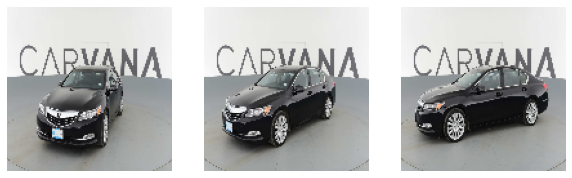

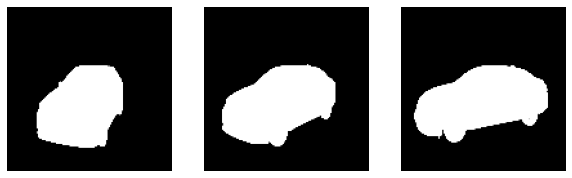

In [12]:
plt.figure(figsize=(10,4))
for i in range(1, 4):
  plt.subplot(1, 3, i)
  img_plot = images[i]
  plt.imshow(img_plot)
  plt.axis('off')

plt.show()

plt.figure(figsize=(10,4))
for i in range(1, 4):
  plt.subplot(1, 3, i)
  mask_plot = masks[i]
  plt.imshow(mask_plot, cmap='gray')
  plt.axis('off')

plt.show()

## Preprocess data

### Expand mask dimension

In [13]:
# Expanding masks in the last axis
mask_np_expand = np.expand_dims(masks_np, axis=-1)
print(masks[0].min(), masks[0].max())

0 255


### Change masks value

- To normalize value
- To encode into numerical encoding

In [14]:
converted_masks = np.round(mask_np_expand/ 255)
# To get background pixels as 1, and car pixels as 0
converted_masks = 1 - converted_masks

Normalize images

In [15]:
converted_images = images_np/ 255.0

### Train/ test split

In [16]:
X_train, X_test, y_train, y_test = train_test_split(converted_images, converted_masks, test_size=0.2, random_state=0)

### Convert the numpy array data into tensor slice

In [17]:
X_train_ts = tf.data.Dataset.from_tensor_slices(X_train)
X_test_ts = tf.data.Dataset.from_tensor_slices(X_test)
y_train_ts = tf.data.Dataset.from_tensor_slices(y_train)
y_test_ts = tf.data.Dataset.from_tensor_slices(y_test)

### Zip tensor slice from dataset

In [18]:
# zip so that the dataset contains the feature and label together
train = tf.data.Dataset.zip((X_train_ts, y_train_ts))
test = tf.data.Dataset.zip((X_test_ts, y_test_ts))

### Convert into prefetch dataset

In [19]:
BATCH_SIZE = 16
AUTOTUNE = tf.data.AUTOTUNE
BUFFER_SIZE = 1000
STEPS_PER_EPOCH = 800//BATCH_SIZE
VALIDATION_STEPS = 200//BATCH_SIZE

In [20]:
train = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
train = train.prefetch(buffer_size = AUTOTUNE)
test = test.batch(BATCH_SIZE).prefetch(buffer_size = AUTOTUNE)

## Prepare model

In [21]:
# Base model for feature extraction
base_model =  tf.keras.applications.MobileNetV2(input_shape = (128,128,3), include_top=False)

# Use the activations of these layers
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
base_model_outputs = [base_model.get_layer(name).output for name in layer_names]

# Create the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=base_model_outputs)

down_stack.trainable = False

9420800/9406464 [==============================] - 0s 0us/step


### Define the upsampling stack

In [22]:
up_stack = [
    pix2pix.upsample(512, 3),  # 4x4 -> 8x8
    pix2pix.upsample(256, 3),  # 8x8 -> 16x16
    pix2pix.upsample(128, 3),  # 16x16 -> 32x32
    pix2pix.upsample(64, 3),   # 32x32 -> 64x64
]

In [23]:
def unet_model(output_channels:int):
  """
  Create modified uNet.
  """
  inputs = tf.keras.layers.Input(shape=[128, 128, 3])

  # Downsampling through the model
  skips = down_stack(inputs)
  x = skips[-1]
  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    concat = tf.keras.layers.Concatenate()
    x = concat([x, skip])

  # This is the last layer of the model
  last = tf.keras.layers.Conv2DTranspose(
      filters=output_channels, kernel_size=3, strides=2,
      padding='same')  #64x64 -> 128x128

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

In [24]:
OUTPUT_CLASSESS = 2 # one hot encoding output
model = unet_model(output_channels=OUTPUT_CLASSESS)

### Compile model

In [25]:
def display(display_list):
  """
  Display input image, true mask and predicted mask.
  """
  plt.figure(figsize=(15,15))
  title = ['Input Image', 'True Mask', 'Predicted Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
    plt.axis('off')
  plt.show()

def create_mask(pred_mask):
  """
  Process predicted mask.
  """
  # the pred_mask will only be 1 channel because of axis argument
  pred_mask = tf.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  return pred_mask

def show_predictions(dataset=None, total_batch=1):
  """
  Show the predicted result along with its input image and true mask.
  """
  if dataset:
    for image, mask in dataset.take(total_batch):
      pred_mask = model.predict(image)
      display([image[0], mask[0], create_mask(pred_mask)[0]])
  else:
    for images, masks in train.take(2):
      sample_image, sample_mask = images[0], masks[0]
      display([sample_image, sample_mask, create_mask(model.predict(sample_image[tf.newaxis, ...]))[0]])


In [26]:
class DisplayCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    """
    Custom callback to display result during training.
    """
    # clear_output(wait=True)
    show_predictions()
    print('\n Sample prediction after epoch {}\n'.format(epoch+1))


In [27]:
def train_model(model, epochs=20):
  """
  Train model.
  """

  # need to output logits since the output layer does not have any activation
  model.compile(optimizer='adam',
                loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                metrics=['accuracy'])
  
  # Initialize checkpoint
  filepath = os.path.join("checkpoint", argname('model'), "weights-improvement-{epoch:02d}-{accuracy:.4f}.hdf5")
  checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(filepath, monitor='accuracy', verbose=1, save_best_only=True, mode='max')

  # Initialize tensorboard
  logdir = os.path.join("logs", argname('model'))
  tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

  return model.fit(train, validation_data=test, epochs=epochs, steps_per_epoch=STEPS_PER_EPOCH, validation_steps=VALIDATION_STEPS, callbacks=[DisplayCallback(), checkpoint_callback, tensorboard_callback])

In [28]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 model (Functional)             [(None, 64, 64, 96)  1841984     ['input_2[0][0]']                
                                , (None, 32, 32, 14                                               
                                4),                                                               
                                 (None, 16, 16, 192                                               
                                ),                                                          

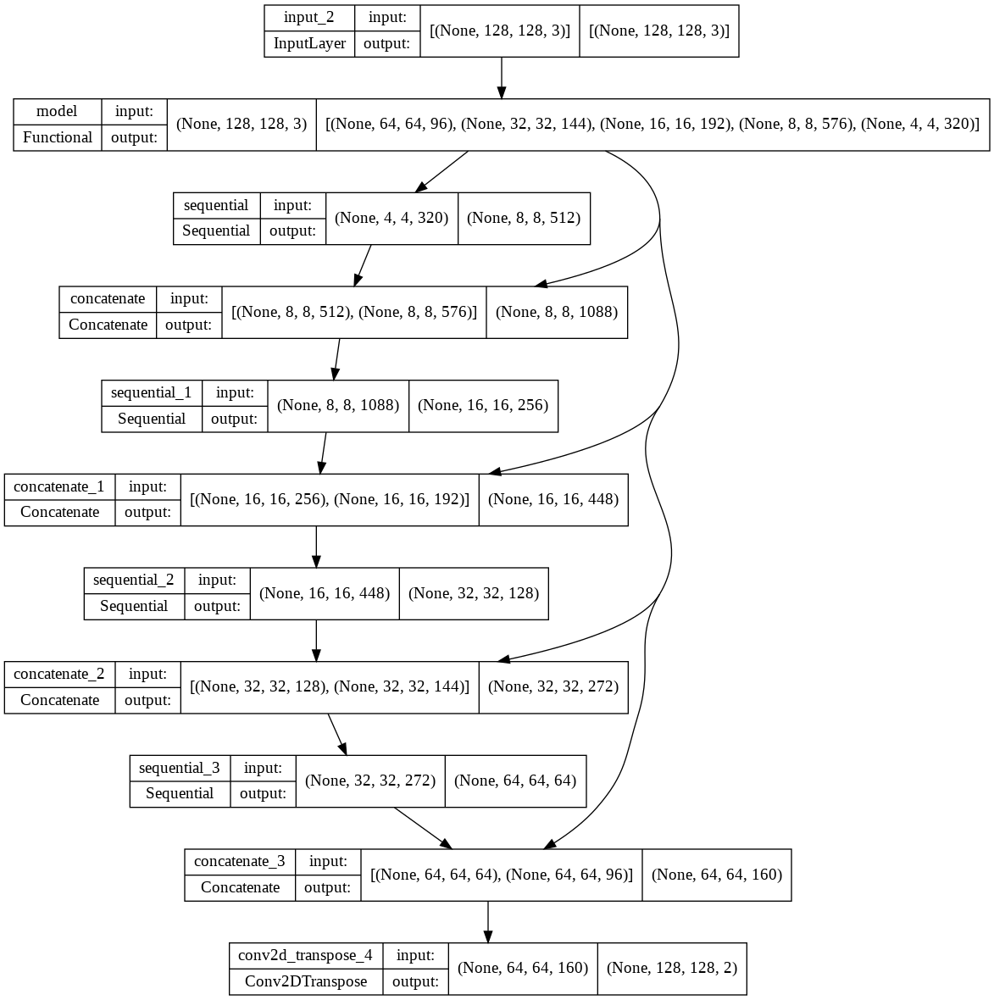

In [29]:
tf.keras.utils.plot_model(model, show_shapes=True)

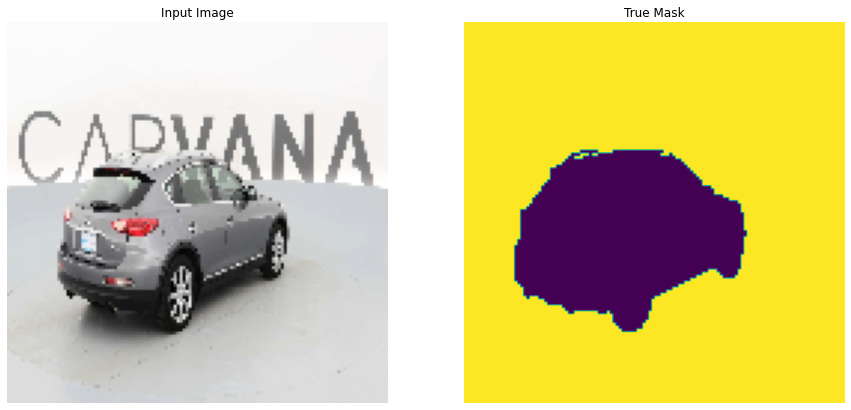

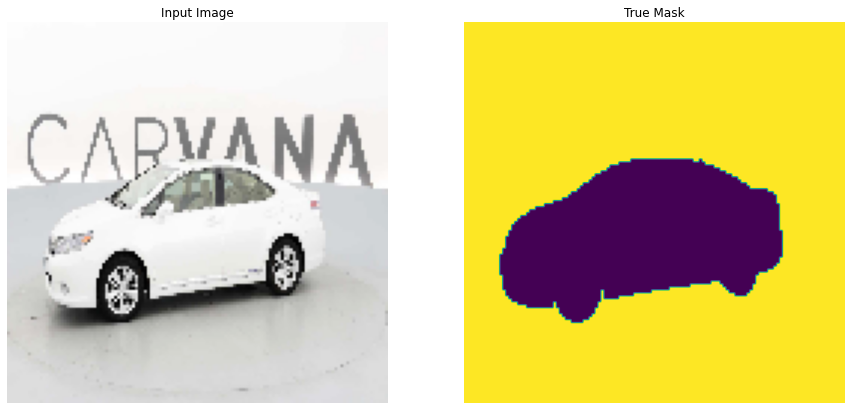

In [30]:
# Display some examples before training
for images, masks in train.take(2):
  sample_image, sample_mask = images[0], masks[0]
  display([sample_image, sample_mask])

# Train model

Epoch 1/20
49/50 [============================>.] - ETA: 0s - loss: 0.1781 - accuracy: 0.9236

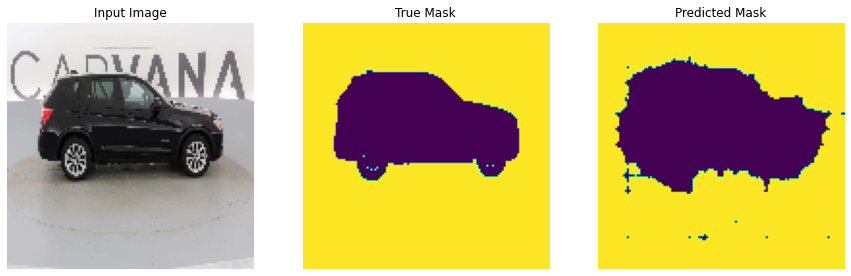

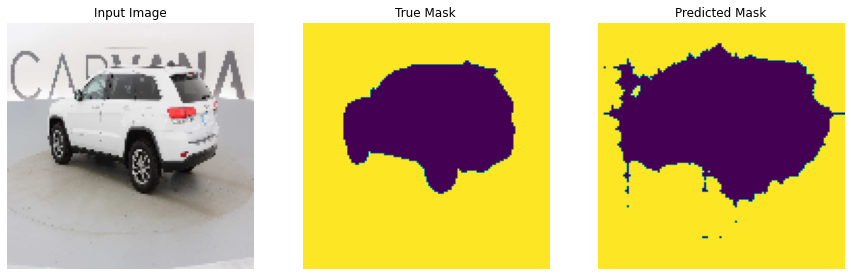


 Sample prediction after epoch 1


Epoch 1: accuracy improved from -inf to 0.92475, saving model to checkpoint/model/weights-improvement-01-0.9248.hdf5
50/50 [==============================] - 21s 155ms/step - loss: 0.1756 - accuracy: 0.9248 - val_loss: 0.5029 - val_accuracy: 0.9047
Epoch 2/20
49/50 [============================>.] - ETA: 0s - loss: 0.0463 - accuracy: 0.9839

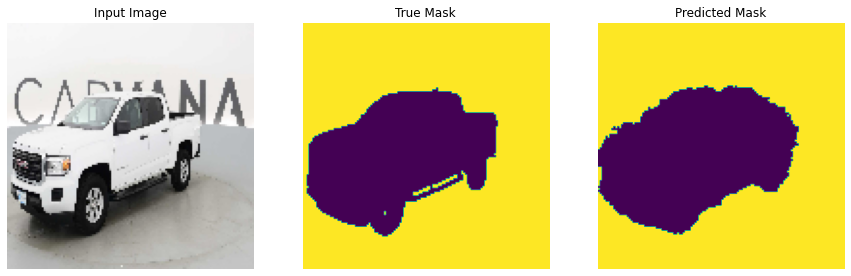

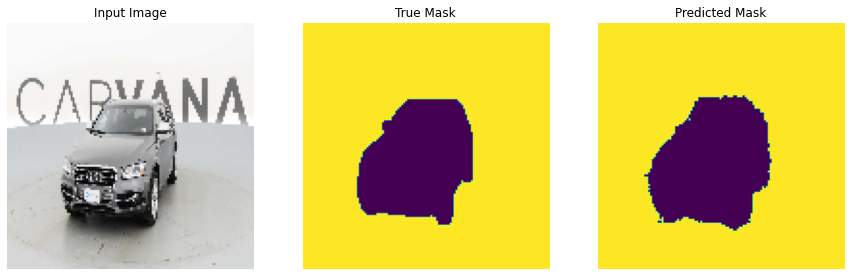


 Sample prediction after epoch 2


Epoch 2: accuracy improved from 0.92475 to 0.98393, saving model to checkpoint/model/weights-improvement-02-0.9839.hdf5
50/50 [==============================] - 6s 113ms/step - loss: 0.0461 - accuracy: 0.9839 - val_loss: 0.0778 - val_accuracy: 0.9730
Epoch 3/20
50/50 [==============================] - ETA: 0s - loss: 0.0348 - accuracy: 0.9871

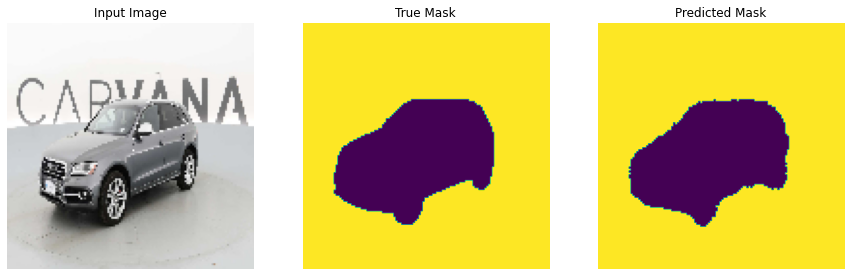

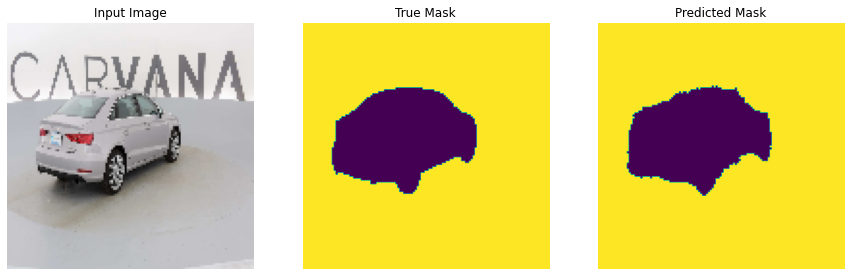


 Sample prediction after epoch 3


Epoch 3: accuracy improved from 0.98393 to 0.98714, saving model to checkpoint/model/weights-improvement-03-0.9871.hdf5
50/50 [==============================] - 6s 112ms/step - loss: 0.0348 - accuracy: 0.9871 - val_loss: 0.0368 - val_accuracy: 0.9861
Epoch 4/20
49/50 [============================>.] - ETA: 0s - loss: 0.0324 - accuracy: 0.9876

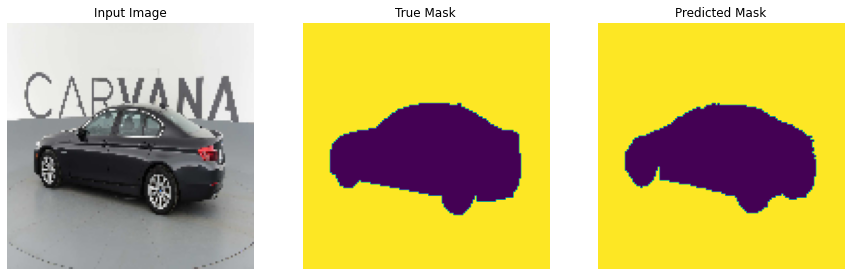

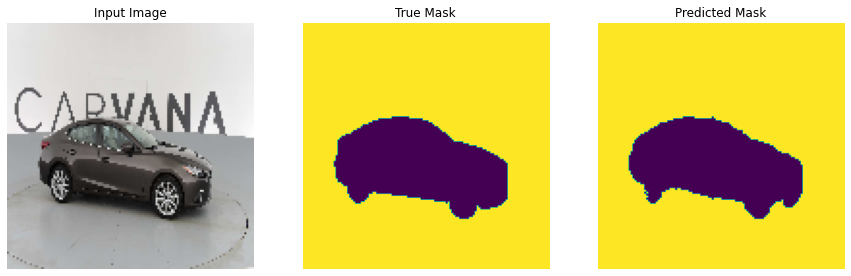


 Sample prediction after epoch 4


Epoch 4: accuracy improved from 0.98714 to 0.98761, saving model to checkpoint/model/weights-improvement-04-0.9876.hdf5
50/50 [==============================] - 6s 129ms/step - loss: 0.0324 - accuracy: 0.9876 - val_loss: 0.0355 - val_accuracy: 0.9863
Epoch 5/20
50/50 [==============================] - ETA: 0s - loss: 0.0287 - accuracy: 0.9890

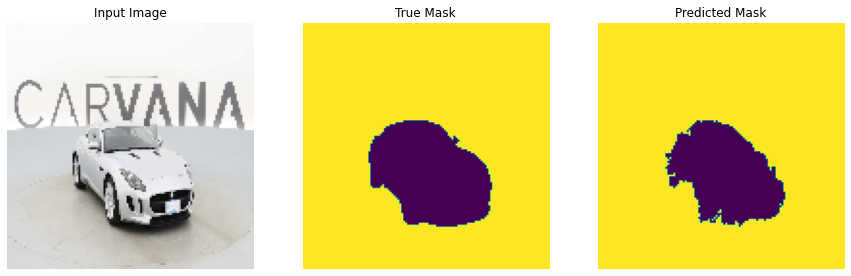

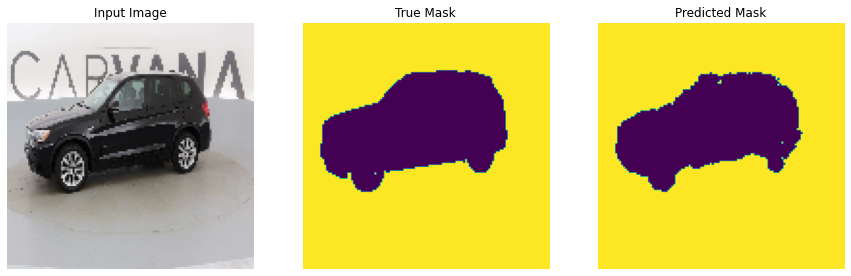


 Sample prediction after epoch 5


Epoch 5: accuracy improved from 0.98761 to 0.98896, saving model to checkpoint/model/weights-improvement-05-0.9890.hdf5
50/50 [==============================] - 6s 131ms/step - loss: 0.0287 - accuracy: 0.9890 - val_loss: 0.0477 - val_accuracy: 0.9810
Epoch 6/20
50/50 [==============================] - ETA: 0s - loss: 0.0255 - accuracy: 0.9901

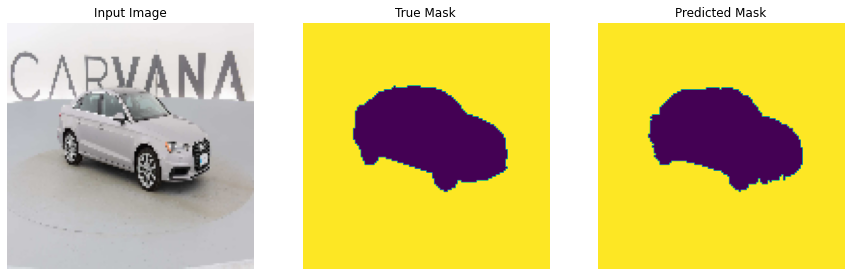

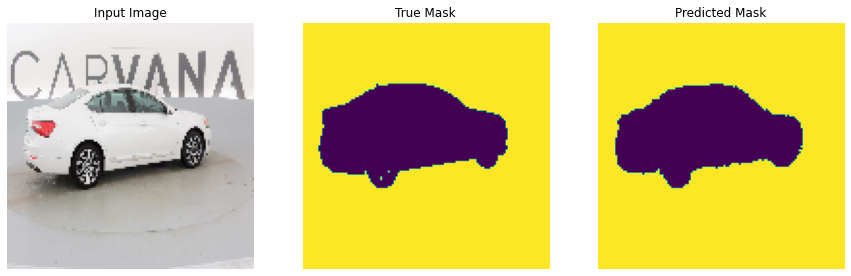


 Sample prediction after epoch 6


Epoch 6: accuracy improved from 0.98896 to 0.99005, saving model to checkpoint/model/weights-improvement-06-0.9901.hdf5
50/50 [==============================] - 6s 115ms/step - loss: 0.0255 - accuracy: 0.9901 - val_loss: 0.0307 - val_accuracy: 0.9883
Epoch 7/20
50/50 [==============================] - ETA: 0s - loss: 0.0248 - accuracy: 0.9903

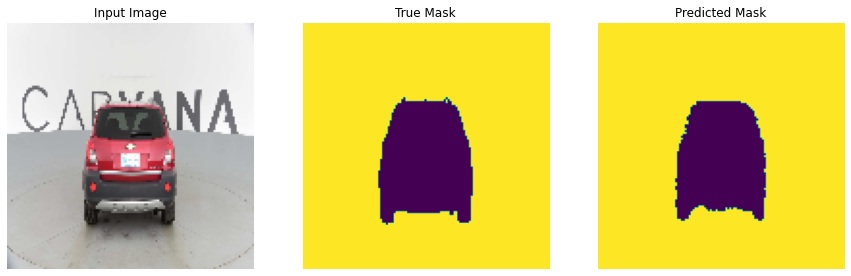

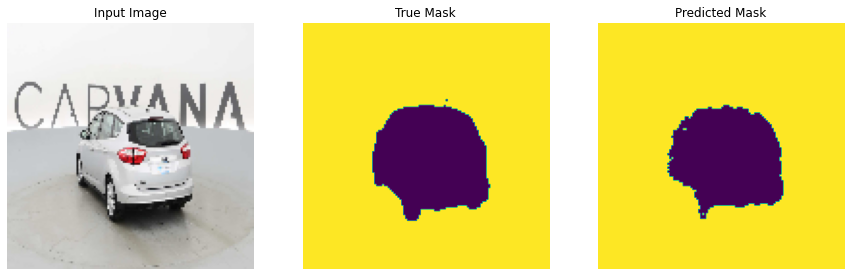


 Sample prediction after epoch 7


Epoch 7: accuracy improved from 0.99005 to 0.99030, saving model to checkpoint/model/weights-improvement-07-0.9903.hdf5
50/50 [==============================] - 6s 114ms/step - loss: 0.0248 - accuracy: 0.9903 - val_loss: 0.0425 - val_accuracy: 0.9831
Epoch 8/20
49/50 [============================>.] - ETA: 0s - loss: 0.0233 - accuracy: 0.9908

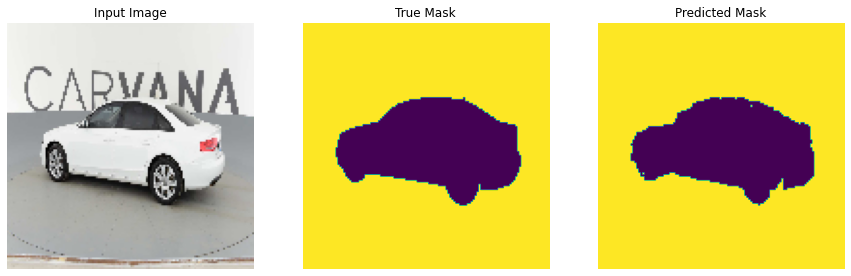

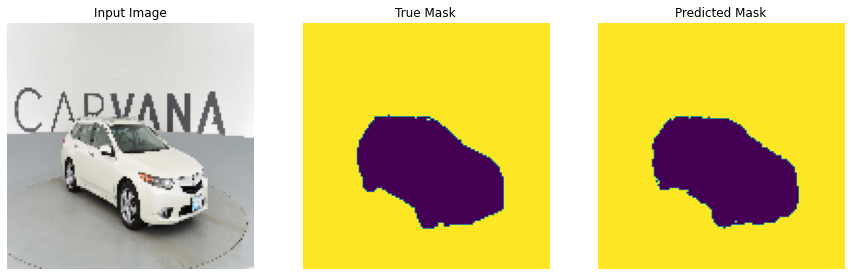


 Sample prediction after epoch 8


Epoch 8: accuracy improved from 0.99030 to 0.99084, saving model to checkpoint/model/weights-improvement-08-0.9908.hdf5
50/50 [==============================] - 6s 117ms/step - loss: 0.0232 - accuracy: 0.9908 - val_loss: 0.0294 - val_accuracy: 0.9883
Epoch 9/20
49/50 [============================>.] - ETA: 0s - loss: 0.0213 - accuracy: 0.9916

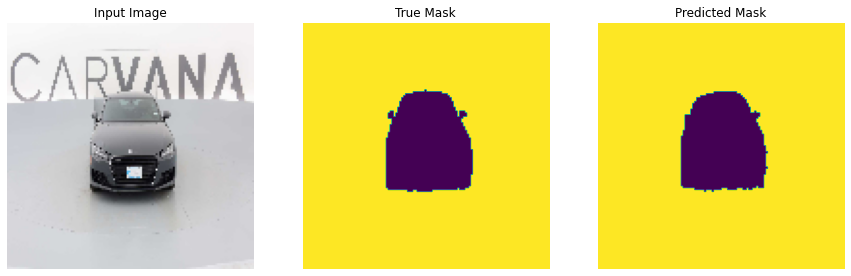

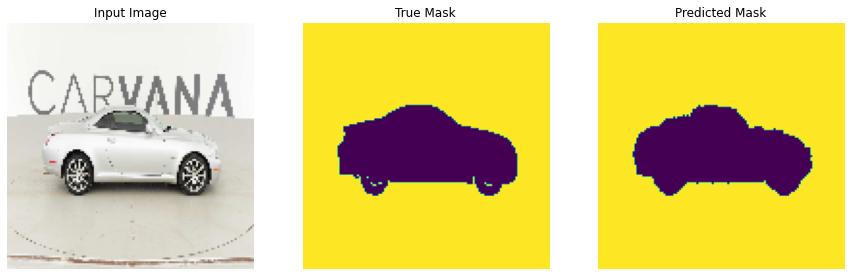


 Sample prediction after epoch 9


Epoch 9: accuracy improved from 0.99084 to 0.99160, saving model to checkpoint/model/weights-improvement-09-0.9916.hdf5
50/50 [==============================] - 6s 118ms/step - loss: 0.0213 - accuracy: 0.9916 - val_loss: 0.0291 - val_accuracy: 0.9884
Epoch 10/20
49/50 [============================>.] - ETA: 0s - loss: 0.0218 - accuracy: 0.9913

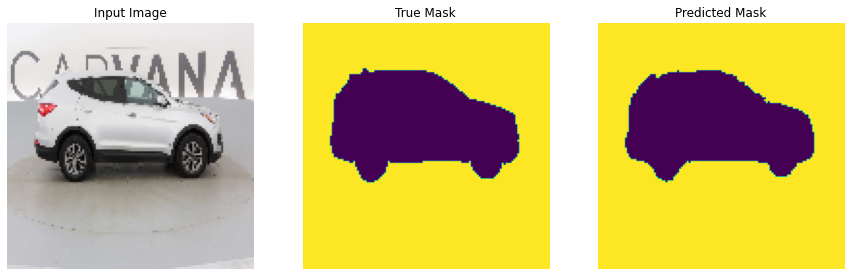

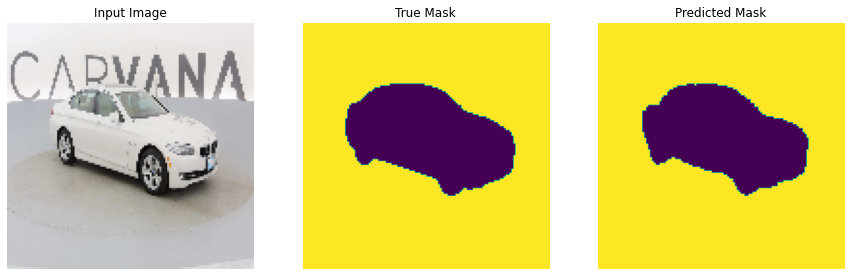


 Sample prediction after epoch 10


Epoch 10: accuracy did not improve from 0.99160
50/50 [==============================] - 6s 124ms/step - loss: 0.0217 - accuracy: 0.9914 - val_loss: 0.0286 - val_accuracy: 0.9885
Epoch 11/20
50/50 [==============================] - ETA: 0s - loss: 0.0202 - accuracy: 0.9920

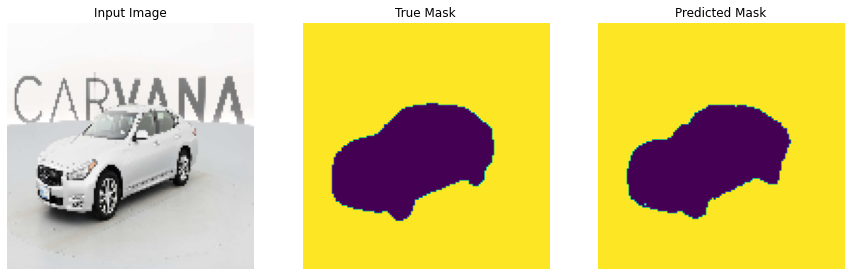

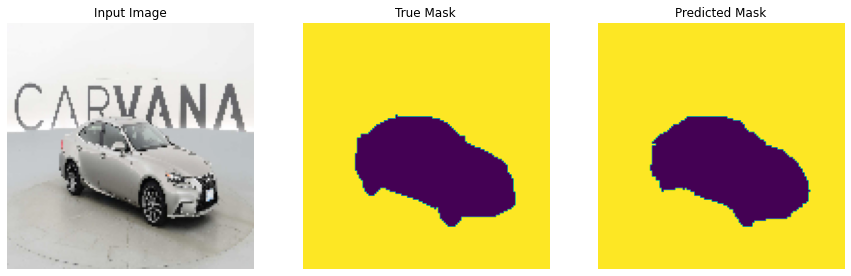


 Sample prediction after epoch 11


Epoch 11: accuracy improved from 0.99160 to 0.99197, saving model to checkpoint/model/weights-improvement-11-0.9920.hdf5
50/50 [==============================] - 6s 116ms/step - loss: 0.0202 - accuracy: 0.9920 - val_loss: 0.0256 - val_accuracy: 0.9897
Epoch 12/20
50/50 [==============================] - ETA: 0s - loss: 0.0192 - accuracy: 0.9924

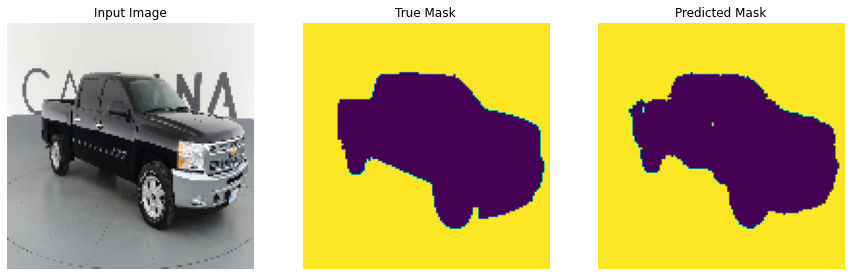

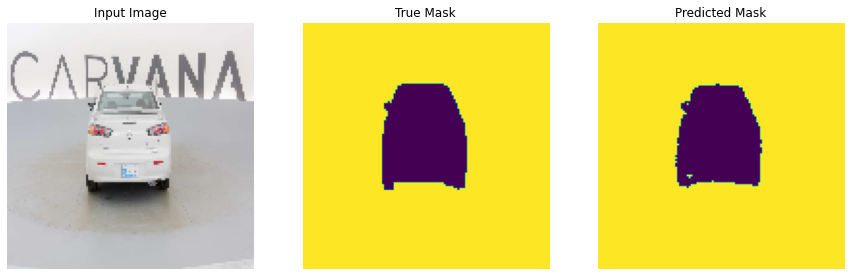


 Sample prediction after epoch 12


Epoch 12: accuracy improved from 0.99197 to 0.99236, saving model to checkpoint/model/weights-improvement-12-0.9924.hdf5
50/50 [==============================] - 6s 117ms/step - loss: 0.0192 - accuracy: 0.9924 - val_loss: 0.0261 - val_accuracy: 0.9895
Epoch 13/20
49/50 [============================>.] - ETA: 0s - loss: 0.0183 - accuracy: 0.9927

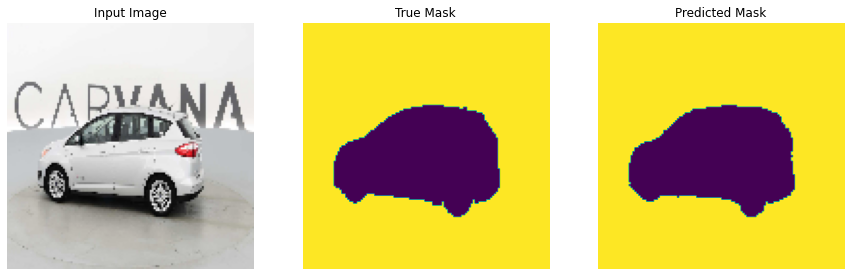

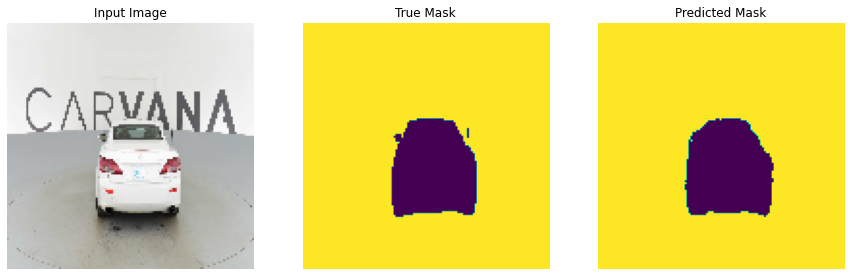


 Sample prediction after epoch 13


Epoch 13: accuracy improved from 0.99236 to 0.99269, saving model to checkpoint/model/weights-improvement-13-0.9927.hdf5
50/50 [==============================] - 6s 117ms/step - loss: 0.0183 - accuracy: 0.9927 - val_loss: 0.0207 - val_accuracy: 0.9917
Epoch 14/20
50/50 [==============================] - ETA: 0s - loss: 0.0185 - accuracy: 0.9926

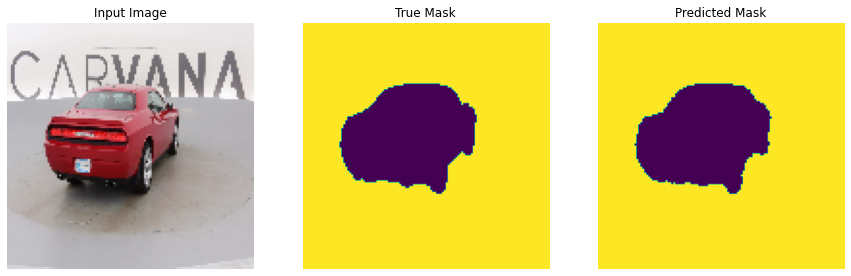

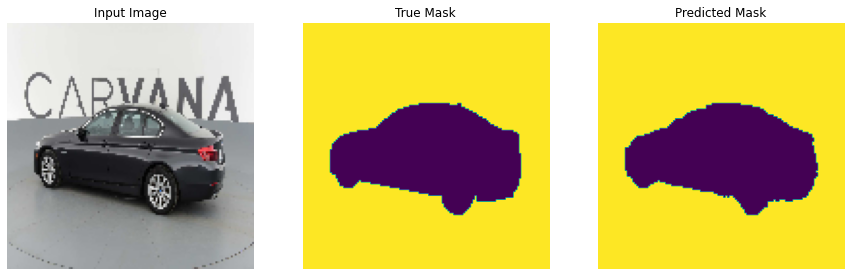


 Sample prediction after epoch 14


Epoch 14: accuracy did not improve from 0.99269
50/50 [==============================] - 5s 106ms/step - loss: 0.0185 - accuracy: 0.9926 - val_loss: 0.0202 - val_accuracy: 0.9918
Epoch 15/20
49/50 [============================>.] - ETA: 0s - loss: 0.0181 - accuracy: 0.9928

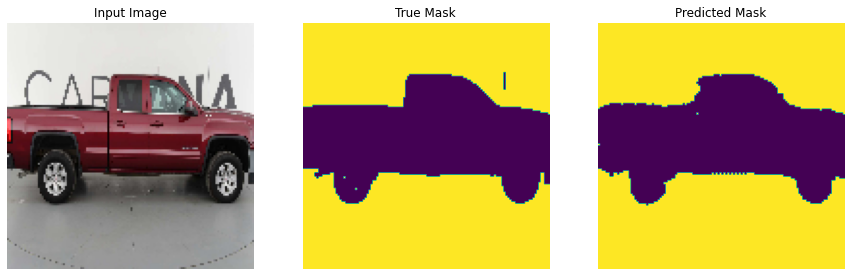

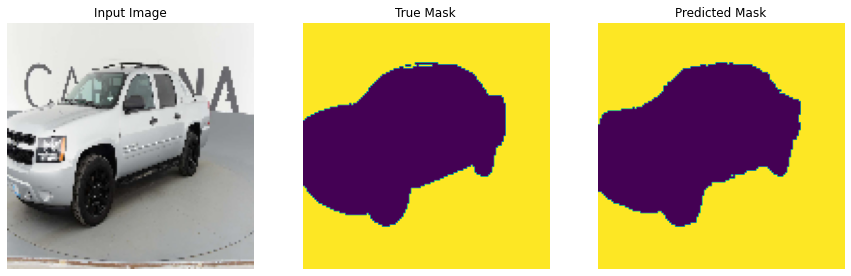


 Sample prediction after epoch 15


Epoch 15: accuracy improved from 0.99269 to 0.99277, saving model to checkpoint/model/weights-improvement-15-0.9928.hdf5
50/50 [==============================] - 6s 114ms/step - loss: 0.0181 - accuracy: 0.9928 - val_loss: 0.0199 - val_accuracy: 0.9920
Epoch 16/20
50/50 [==============================] - ETA: 0s - loss: 0.0173 - accuracy: 0.9931

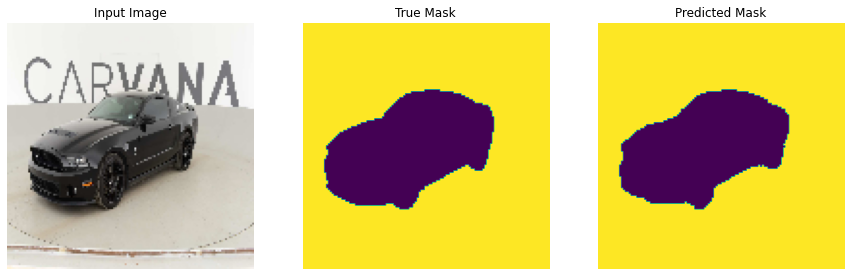

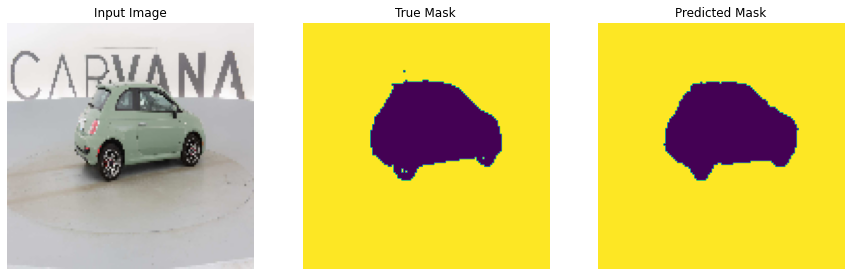


 Sample prediction after epoch 16


Epoch 16: accuracy improved from 0.99277 to 0.99305, saving model to checkpoint/model/weights-improvement-16-0.9931.hdf5
50/50 [==============================] - 6s 116ms/step - loss: 0.0173 - accuracy: 0.9931 - val_loss: 0.0197 - val_accuracy: 0.9921
Epoch 17/20
49/50 [============================>.] - ETA: 0s - loss: 0.0167 - accuracy: 0.9933

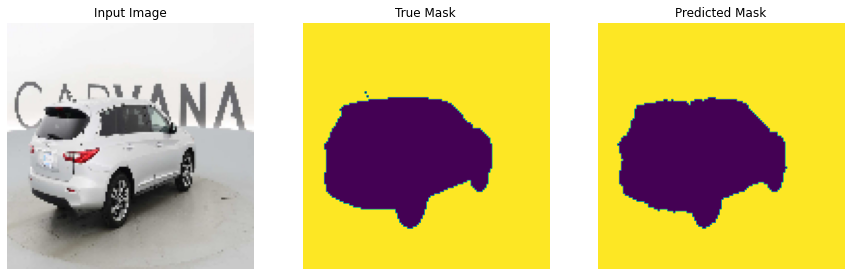

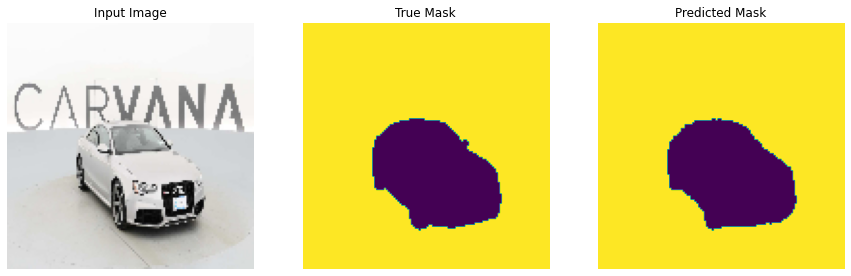


 Sample prediction after epoch 17


Epoch 17: accuracy improved from 0.99305 to 0.99334, saving model to checkpoint/model/weights-improvement-17-0.9933.hdf5
50/50 [==============================] - 6s 118ms/step - loss: 0.0167 - accuracy: 0.9933 - val_loss: 0.0195 - val_accuracy: 0.9922
Epoch 18/20
49/50 [============================>.] - ETA: 0s - loss: 0.0163 - accuracy: 0.9935

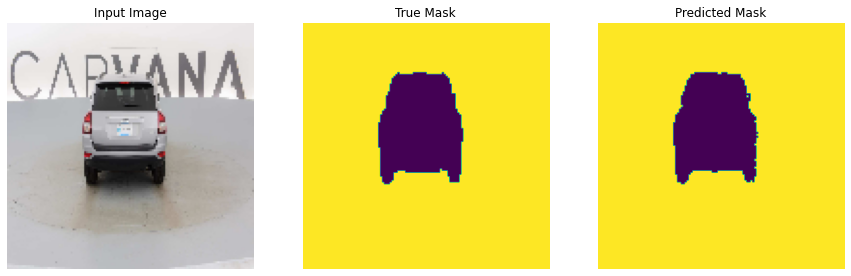

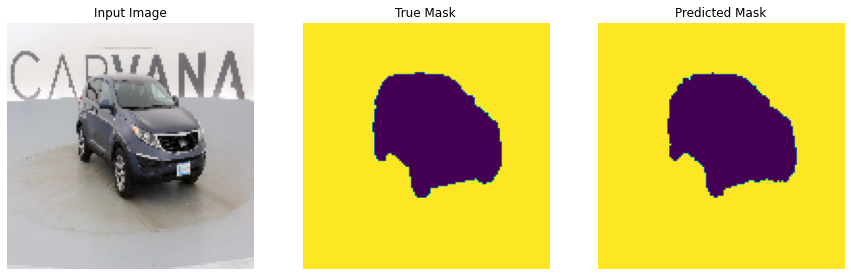


 Sample prediction after epoch 18


Epoch 18: accuracy improved from 0.99334 to 0.99350, saving model to checkpoint/model/weights-improvement-18-0.9935.hdf5
50/50 [==============================] - 6s 119ms/step - loss: 0.0163 - accuracy: 0.9935 - val_loss: 0.0209 - val_accuracy: 0.9917
Epoch 19/20
50/50 [==============================] - ETA: 0s - loss: 0.0156 - accuracy: 0.9937

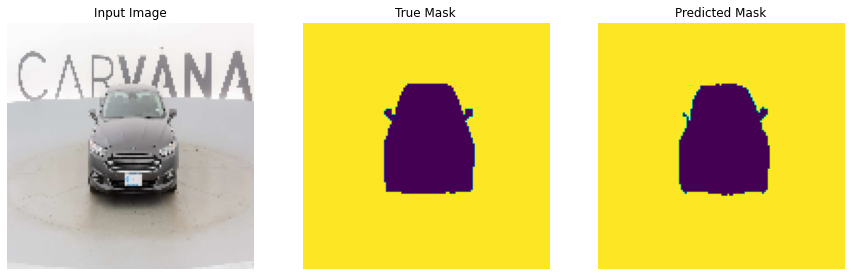

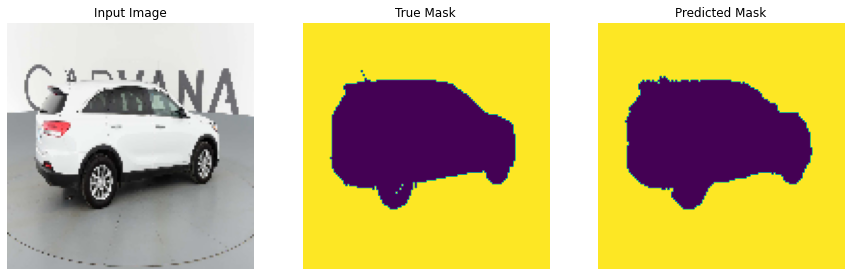


 Sample prediction after epoch 19


Epoch 19: accuracy improved from 0.99350 to 0.99375, saving model to checkpoint/model/weights-improvement-19-0.9937.hdf5
50/50 [==============================] - 7s 135ms/step - loss: 0.0156 - accuracy: 0.9937 - val_loss: 0.0190 - val_accuracy: 0.9924
Epoch 20/20
49/50 [============================>.] - ETA: 0s - loss: 0.0160 - accuracy: 0.9936

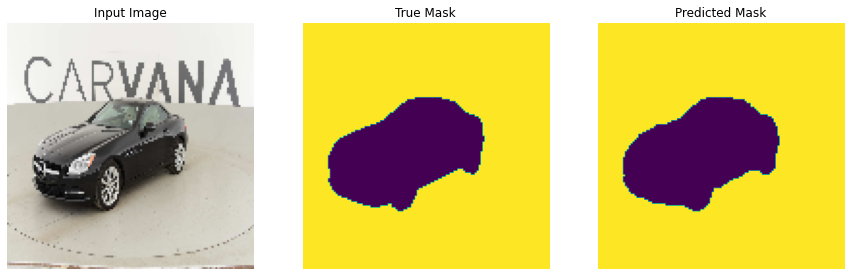

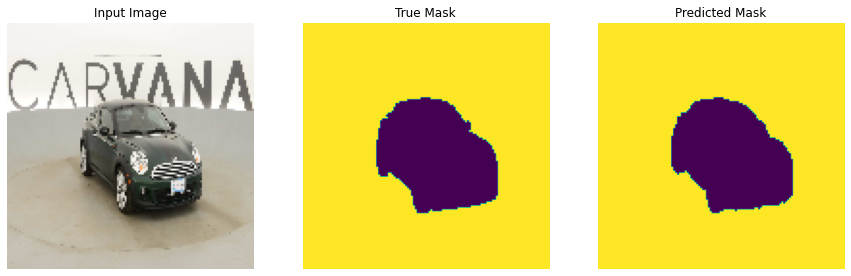


 Sample prediction after epoch 20


Epoch 20: accuracy did not improve from 0.99375
50/50 [==============================] - 6s 113ms/step - loss: 0.0160 - accuracy: 0.9936 - val_loss: 0.0193 - val_accuracy: 0.9922


In [31]:
history = train_model(model)

# Observe model on TensorBoard

In [32]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

# Deploy model

### Show prediction on test set

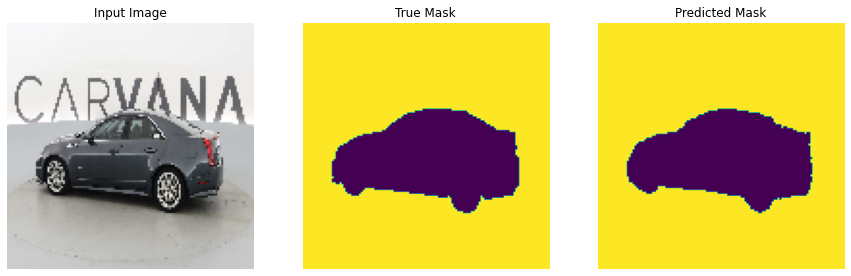

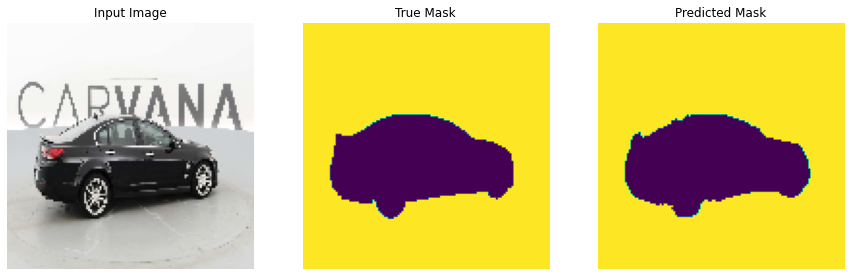

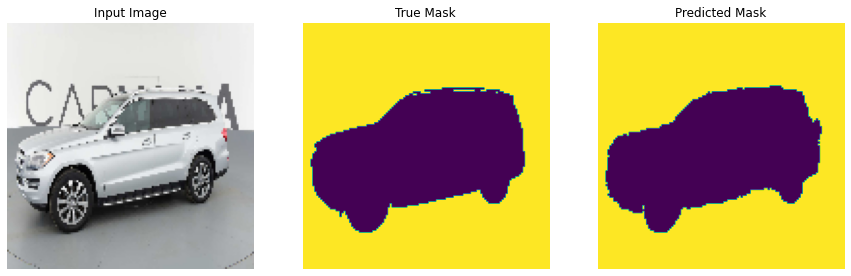

In [33]:
show_predictions(test, 3)